<a href="https://colab.research.google.com/github/MBrandao07/EDA/blob/main/EDA_em_Credito.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## O Problema do Negócio

O desafio apresentado envolve prever a capacidade de um cliente quitar um empréstimo. Nesse contexto, o Banco XPTO busca ampliar o acesso ao crédito, especialmente para pessoas com pouco ou nenhum histórico financeiro. A ideia é utilizar uma combinação de dados, como transações bancárias, histórico de pagamentos e características socioeconômicas, para **desenvolver um modelo preditivo que estime a probabilidade de inadimplência**.

Essa iniciativa é importante porque permite ao banco reduzir os riscos associados à concessão de crédito, ao mesmo tempo em que promove inclusão financeira, oferecendo oportunidades a quem normalmente teria dificuldades em conseguir um empréstimo.

**Público-alvo**: pessoas que solicitam empréstimos no Banco XPTO. Na base de dados, cada linha representa um empréstimo, identificado por um número único.  


Obs.: Vale lembrar que este notebook será apenas a EDA dessa base dados.  


## **Análise Exploratória**

#### **Análise Univariada**

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [3]:
base_dados = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/application_train.csv')
base_dados.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [4]:
base_dados.shape

(307511, 122)

In [5]:
# Criando variável para metadados contendo nome das colunas, tipos, quantidade de nulos, percentual de nulos, cardinalidade.

def generate_metadata(dataframe):
  metadata = pd.DataFrame({
        'nome_variavel': dataframe.columns,
        'tipo': dataframe.dtypes,
        'qt_nulos': dataframe.isnull().sum(),
        'percent_nulos': round((dataframe.isnull().sum() / len(dataframe))* 100,2),
        'cardinalidade': dataframe.nunique(),
    })

  metadata = metadata.sort_values(by='percent_nulos')
  metadata = metadata.reset_index(drop=True)

  return metadata

In [6]:
generate_metadata(base_dados)

,nome_variavel,tipo,qt_nulos,percent_nulos,cardinalidade
0,SK_ID_CURR,int64,0,0.00,307511
1,TARGET,int64,0,0.00,2
2,NAME_CONTRACT_TYPE,object,0,0.00,2
3,CODE_GENDER,object,0,0.00,3
4,FLAG_OWN_CAR,object,0,0.00,2
5,FLAG_OWN_REALTY,object,0,0.00,2
6,CNT_CHILDREN,int64,0,0.00,15
7,AMT_INCOME_TOTAL,float64,0,0.00,2548
8,AMT_CREDIT,float64,0,0.00,5603
9,AMT_ANNUITY,float64,12,0.00,13672


É possível perceber que temos quase 50 colunas onde a taxa de nulos é de cerca de 50% ou maior

In [7]:
base_dados.describe().round(2)

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.00,307511.00,307511.00,3.075110e+05,307511.00,307499.00,307233.00,307511.00,307511.00,307511.00,307511.00,307511.00,104582.00,307511.0,307511.00,307511.0,307511.00,307511.00,307511.00,307509.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,134133.00,306851.00,246546.00,151450.00,127568.00,157504.00,103023.00,92646.00,143620.00,152683.00,154491.00,98869.00,124921.00,97312.00,153161.00,93997.00,137829.00,151450.00,127568.00,157504.00,103023.00,92646.00,143620.00,152683.00,154491.00,98869.00,124921.00,97312.00,153161.00,93997.00,137829.00,151450.00,127568.00,157504.00,103023.00,92646.00,143620.00,152683.00,154491.00,98869.00,124921.00,97312.00,153161.00,93997.00,137829.00,159080.00,306490.00,306490.00,306490.00,306490.00,307510.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.0,307511.00,307511.0,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,307511.00,265992.00,265992.00,265992.00,265992.00,265992.00,265992.00
mean,278180.52,0.08,0.42,1.687979e+05,599026.00,27108.57,538396.21,0.02,-16037.00,63815.05,-4986.12,-2994.20,12.06,1.0,0.82,0.2,1.00,0.28,0.06,2.15,2.05,2.03,12.06,0.02,0.05,0.04,0.08,0.23,0.18,0.50,0.51,0.51,0.12,0.09,0.98,0.75,0.04,0.08,0.15,0.23,0.23,0.07,0.10,0.11,0.01,0.03,0.11,0.09,0.98,0.76,0.04,0.07,0.15,0.22,0.23,0.06,0.11,0.11,0.01,0.03,0.12,0.09,0.98,0.76,0.04,0.08,0.15,0.23,0.23,0.07,0.10,0.11,0.01,0.03,0.10,1.42,0.14,1.41,0.10,-962.86,0.00,0.71,0.00,0.02,0.09,0.00,0.08,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.01,0.00,0.01,0.00,0.00,0.00,0.01,0.01,0.03,0.27,0.27,1.90
std,102790.18,0.27,0.72,2.371231e+05,402490.78,14493.74,369446.46,0.01,4363.99,141275.77,3522.89,1509.45,11.94,0.0,0.38,0.4,0.04,0.45,0.23,0.91,0.51,0.50,3.27,0.12,0.22,0.20,0.27,0.42,0.38,0.21,0.19,0.19,0.11,0.08,0.06,0.11,0.08,0.13,0.10,0.14,0.16,0.08,0.09,0.11,0.05,0.07,0.11,0.08,0.06,0.11,0.07,0.13,0.10,0.14,0.16,0.08,0.10,0.11,0.05,0.07,0.11,0.08,0.06,0.11,0.08,0.13,0.10,0.15,0.16,0.08,0.09,0.11,0.05,0.07,0.11,2.40,0.45,2.38,0.36,826.81,0.0

##### BoxPlots

In [8]:
# criando uma função para criar boxplots
def boxplots (dataframe):
  # selecionando apenas as colunas numéricas
  numeric_columns = dataframe.select_dtypes(include=['float64', 'int64']).columns

  # definindo o número de linhas baseado no número de colunas numéricas
  nrows = len(numeric_columns) // 3 + (len(numeric_columns) % 3 > 0)

  # criando o painel dos gráficos
  fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(15, nrows * 5))

  # ajustando o layout
  plt.tight_layout(pad = 4)

  # escolhendo a paleta de cores
  sns.set_style("whitegrid")

  # plotando o boxplot de cada coluna
  for i, column in enumerate(numeric_columns):
      sns.boxplot(data=dataframe[column], ax=axes[i//3, i%3], color='skyblue')
      axes[i//3, i%3].set_title(f'{column}', fontdict={'fontsize': 14, 'fontweight': 'bold'})
      axes[i//3, i%3].set_ylabel('')

  # removendo os gráficos vazios (se existir)
  for j in range(i+1, nrows * 3):
    fig.delaxes(axes.flatten()[j])

  # adicionando um título principal ao painel
  fig.suptitle("Análise descritiva - Boxplots", fontsize=20, fontweight='bold', y=1.00)

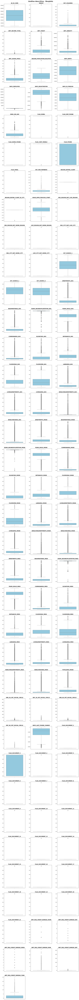

In [9]:
boxplots(base_dados)

É possível observar que temos diversas colunas com outliers e algumas que talvez não sejam significativas para a análise, então o ideal seria conversar com o dono da base para verificarmos qual a ideia dele para a base.

In [10]:
base_dados['DAYS_EMPLOYED'].value_counts().sort_values(ascending=False)

,count
DAYS_EMPLOYED,
365243,55374
-200,156
-224,152
-230,151
-199,151
-212,150
-229,143
-384,143
-231,140


Podemos verificar que temos 55374 clientes na base que estão empregados a 365243 dias, o que é estranho.

In [11]:
# vamos verificar quantos valores temos acima de 0
base_dados[base_dados['DAYS_EMPLOYED'] > 0]['DAYS_EMPLOYED'].value_counts().sort_values()

,count
DAYS_EMPLOYED,
365243,55374


In [12]:
# verificando as primeiras linhas que tem 365243 como dias trabalhados
base_dados[base_dados['DAYS_EMPLOYED'] == 365243].head(20)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
8,100011,0,Cash loans,F,N,Y,0,112500.000,1019610.0,33826.5,913500.0,Children,Pensioner,Secondary / secondary special,Married,House / apartment,0.018634,-20099,365243,-7427.0,-3514,NaN,1,0,0,1,0,0,NaN,2.0,2,2,WEDNESDAY,14,0,0,0,0,0,0,XNA,0.587334,0.205747,0.751724,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,1.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
11,100015,0,Cash loans,F,N,Y,0,38419.155,148365.0,10678.5,135000.0,Children,Pensioner,Secondary / secondary special,Married,House / apartment,0.015221,-20417,365243,-5246.0,-2512,NaN,1,0,0,1,1,0,NaN,2.0,2,2,FRIDAY,7,0,0,0,0,0,0,XNA,0.722044,0.555183,0.652897,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-2396.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0
23,100027,0,Cash loans,F,N,Y,0,83250.000,239850.0,23850.0,225000.0,Unaccompanied,Pensioner,Secondary / secondary special,Married,House / apartment,0.006296,-24827,365243,-9012.0,-3684,NaN,1,0,0,1,1,0,NaN,2.0,3,3,FRIDAY,12,0,0,0,0,0,0,XNA,NaN,0.624305,0.669057,0.1443,0.0848,0.9876,0.8300,0.1064,0.14,0.1207,0.3750,0.4167,0.2371,0.1173,0.1484,0.0019,0.0007,0.1261,0.0754,0.9876,0.8367,0.0000,0.1208,0.1034,0.3750,0.4167,0.2425,0.1102,0.0923,0.0000,0.0000,0.1457,0.0848,0.9876,0.8323,0.1071,0.14,0.1207,0.3750,0.4167,0.2412,0.1193,0.1510,0.0019,0.0007,org spec account,block of flats,0.1640,Mixed,No,0.0,0.0,0.0,0.0,-795.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
38,100045,0,Cash loans,F,N,Y,0,99000.000,2

In [13]:
# verificando a quantidade de 'Pensioner' na base
base_dados[base_dados['NAME_INCOME_TYPE'] == 'Pensioner']['NAME_INCOME_TYPE'].value_counts().sort_values()

,count
NAME_INCOME_TYPE,
Pensioner,55362


In [14]:
base_dados['NAME_INCOME_TYPE'].value_counts().sort_values()

,count
NAME_INCOME_TYPE,
Maternity leave,5
Businessman,10
Student,18
Unemployed,22
State servant,21703
Pensioner,55362
Commercial associate,71617
Working,158774


In [15]:
base_dados[base_dados['DAYS_EMPLOYED'] == 365243]['NAME_INCOME_TYPE'].value_counts().sort_values()

,count
NAME_INCOME_TYPE,
Unemployed,22
Pensioner,55352


Todas as pessoas que possuem 365243 dias empregados ou são aposentados ou desempregados.

##### Histogramas

In [17]:
def histograms_var_num(dataframe):
  """
  Função para gerar histogramas das variáveis numéricas de um DataFrame utilizando a curva KDE (Kernel Density Estimation) como correção.

  Args:
      dataframe: DataFrame contendo as variáveis numéricas.
  """
  # selecionando as colunas numéricas
  numeric_columns = dataframe.select_dtypes(include=['float64', 'int64']).columns

  # definindo o número de linhas
  nrows = len(numeric_columns) // 3 + (len(numeric_columns) % 3 > 0)

  # criando o painel dos gráficos
  fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(14, nrows * 4))

  # ajustando o layout
  plt.tight_layout(pad=4)

  # configurando o estilo e a paleta de cores
  sns.set_style('whitegrid')

  # plotando os histogramas com KDE
  for i, column in enumerate(numeric_columns):
    sns.histplot(data=dataframe, x=dataframe[column], kde=True, ax=axes[i//3, i%3], color='skyblue', bins = 30)
    axes[i//3, i%3].set_title(f'{column}', fontdict={'fontsize': 14, 'fontweight': 'bold'})
    axes[i//3, i%3].set_ylabel('Frequência')
    axes[i//3, i%3].tick_params(axis='both', which='major', labelsize=12)

  # removendo os gráficos vazios (se existir)
  for j in range(i+1, nrows * 3):
    fig.delaxes(axes.flatten()[j])

  # adicionando um título a imagem geral
  fig.suptitle("Análise descritiva - Histogramas", fontsize=20, fontweight='bold', y=1.00)

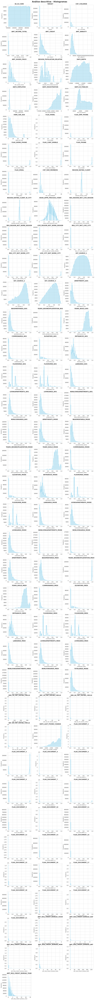

In [18]:
histograms_var_num(base_dados)

#### Análise das variáveis categóricas

##### Gráfico de barras

In [38]:
def plot_categ_freq_pt(df, corte_cardinalidade = 30, graficos_por_linha = 3):
  """
  Plota as gráficos de barras das variáveis categóricas de um DataFrame.

  Args:
      df: DataFrame contendo as variáveis categóricas.
      corte_cardinalidade: Valor máximo de cardinalidade para considerar uma variável categórica.
      graficos_por_linha: Número de gráficos por linha na figura.
  """

  # gerando metadados para o dataframe
  metadados = []
  for coluna in df.columns:
    metadados.append({
    'Variavel':coluna,
    'Tipo':df[coluna].dtype,
    'Cardinalidade':df[coluna].nunique()
     })

  df_metadados = pd.DataFrame(metadados)

  # selecionando as colunas categóricas e menores que cardinalidade = 30
  variaveis_categoricas = df_metadados[(df_metadados['Tipo'] == 'object') & (df_metadados['Cardinalidade'] <= corte_cardinalidade)]

  # calculando o numero de linhas e colunas dos subplots
  n_linhas = -(-len(variaveis_categoricas)// graficos_por_linha) #ceiling division - arredondamento para cima
  n_colunas = min(len(variaveis_categoricas), graficos_por_linha)

  # plotando as variáveis categóricas
  fig, axes = plt.subplots(n_linhas, n_colunas, figsize=(12, n_linhas * 4))

  for i, (idx, linha) in enumerate(variaveis_categoricas.iterrows()):
    var = linha['Variavel']
    ax = axes[i // graficos_por_linha, i % graficos_por_linha]
    df[var].value_counts().sort_index().plot(kind='bar', ax=ax, color='skyblue')
    ax.set_title(f'{var}', fontdict={'fontsize': 14, 'fontweight': 'bold'})
    ax.set_ylabel('Frequência')
    ax.set_xlabel(var)

  # removendo os gráficos vazios (se existir)
  for j in range(i+1, n_linhas * n_colunas):
    fig.delaxes(axes.flatten()[j])

  # adicionando um titulo principal
  fig.suptitle("Análise Bar Plot", fontsize=20, fontweight='bold', y=1.00)

  plt.tight_layout()
  plt.show()

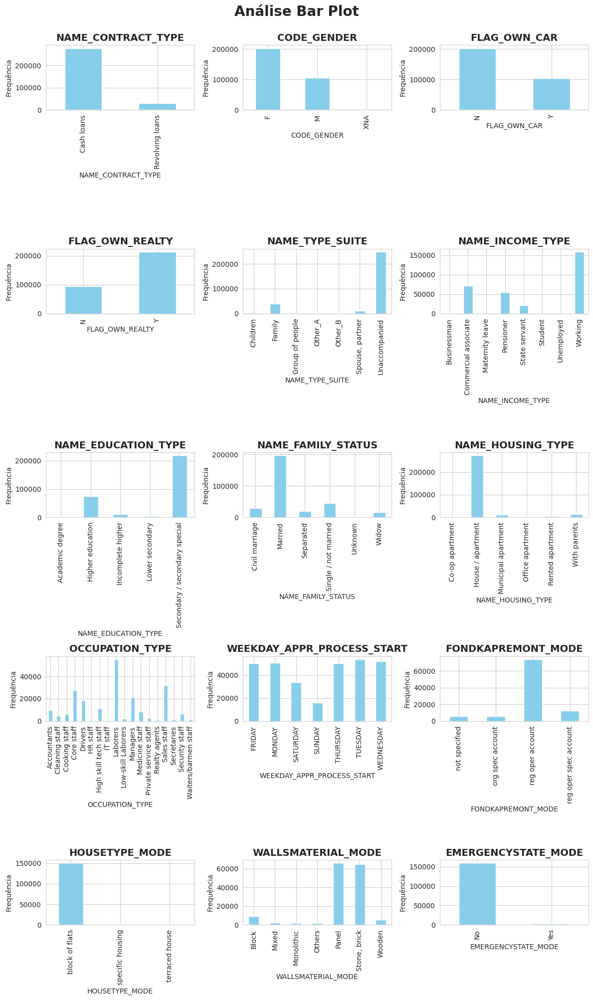

In [39]:
plot_categ_freq_pt(base_dados, corte_cardinalidade=30, graficos_por_linha=3)

#### **Análise Multivariada**

##### **Análise das variáveis numéricas**

##### KDE Plot

In [42]:
def kdeplots_var_num_target(dataframe, target_column):
  """
  Função para gerar gráficos KDE das variáveis numéricas em relação à variável alvo.

  Args:
  :dataframe: DataFrame contendo as variáveis numéricas e a variável alvo.
  :target_column: Nome da coluna da variável alvo.
  """
  # selecionando as colunas numéricas
  numeric_columns = dataframe.select_dtypes(include=['float64', 'int64']).columns

  # definindo o numero de linhas com base no numero de colunas numéricas
  nrows = len(numeric_columns) // 3 + (len(numeric_columns) % 3 > 0)

  fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(14, nrows * 4))

  # ajustando o layout
  plt.tight_layout(pad=4)

  # configurando o estilo e a paleta de cores
  sns.set_style('whitegrid')

  # plotando os kdeplots
  for i, column in enumerate(numeric_columns):
    sns.kdeplot(data=dataframe[dataframe[target_column] == 1][column], ax=axes[i//3,i%3], color='blue', label='1', fill=True, warn_singular=False)
    sns.kdeplot(data=dataframe[dataframe[target_column] == 0][column], ax=axes[i//3,i%3], color='red', label='0', fill=True, warn_singular=False)
    axes[i//3,i%3].set_title(f'{column}', fontdict={'fontsize': 14, 'fontweight': 'bold'})
    axes[i//3,i%3].set_ylabel('Densidade')
    axes[i//3,i%3].tick_params(axis='both', which='major', labelsize=12)
    if i == 0:
      axes[i//3,i%3].legend(title=target_column)

  # removendo gráficos vazios (se existir)
  for j in range(i+1, nrows * 3):
    fig.delaxes(axes.flatten()[j])

  # adicionando um titulo principal
  fig.suptitle("Análise Multivariada - KDE Plot", fontsize=20, fontweight='bold', y=1.00)

  plt.show()

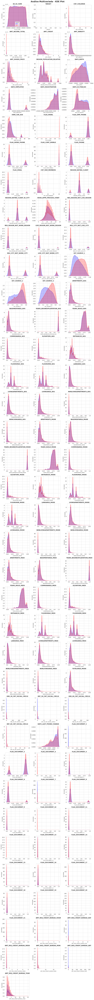

In [43]:
kdeplots_var_num_target(base_dados, 'TARGET')

##### **Análise de variáveis categóricas**

##### Gráfico de barras segmentado

In [56]:
def plot_cat_vs_target_cutoff(dataframe, target_column, cutoff=10):
  """
  Plota gráficos de barras segmentadas para analisar as variáveis categóricas em relação à variável alvo.

  Args:
      dataframe: DataFrame contendo as variáveis categóricas e a variável alvo.
      target_column: Nome da coluna da variável alvo.
      cutoff: Valor para limitar a quantidade de variáveis plotadas
  """

  # selecionando colunas categóricas
  categorical_columns = dataframe.select_dtypes(include=['object', 'category']).columns

  # filtrando as colunas com base no cutoff
  categorical_columns_filtered = [col for col in categorical_columns if dataframe[col].nunique() <= cutoff]

  # definindo o número de linhas e colunas para os subplots
  n_rows = len(categorical_columns_filtered) // 3 + (len(categorical_columns_filtered) % 3 > 0)
  n_cols = min(len(categorical_columns_filtered), 3)

  # criando os subplots
  fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5))

  # ajustando o layout
  plt.tight_layout(pad=4)

  for i, column in enumerate(categorical_columns_filtered):
    # calculando as proporções de cada categoria para cada valor do target
    prop_df = (dataframe.groupby([column, target_column]).size() / dataframe.groupby(target_column).size()).unstack()

    # plotando os gráficos de barras
    ax = axes[i // n_cols, i % n_cols] if n_rows > 1 else axes[i]
    prop_df.plot(kind='bar', stacked=True, ax=ax, color=['skyblue', 'salmon'])
    ax.set_title(f'{column}', fontdict={'fontsize': 14, 'fontweight': 'bold'})
    ax.set_ylabel('Proporção')
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

    # ajustando o layout do subplot
    plt.subplots_adjust(wspace=0.5, hspace=0.7)

  # removendo subplots vazios (se existir)
  for j in range(len(categorical_columns_filtered), n_rows * n_cols):
    if n_rows > 1:
      fig.delaxes(axes.flatten()[j])
    else:
      fig.delaxes(axes)


  # adicionando um título principal
  fig.suptitle("Análise Multivariada - Variáveis categóricas em relação ao target", fontsize=20, fontweight='bold', y=1.00)

  plt.show()

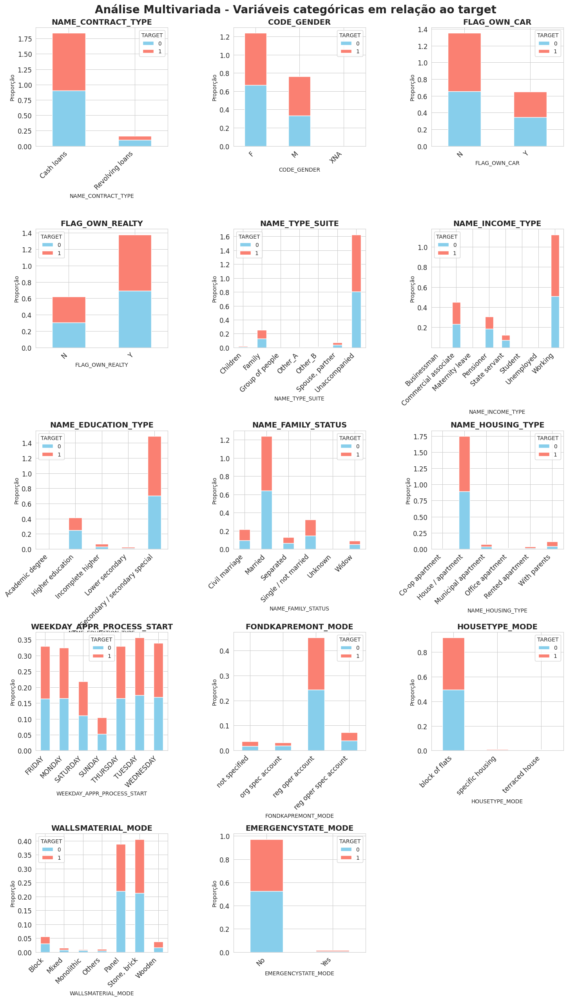

In [57]:
plot_cat_vs_target_cutoff(base_dados,'TARGET',cutoff = 8)

##### Gráfico de barras empilhadas 100%

In [58]:
def plot_cat_vs_target_percentage(dataframe, target_column, cutoff=10):
  """
  Plota gráficos de barras empilhadas 100% para analisar as variáveis categóricas em relação à variável alvo.

  Args:
      dataframe: DataFrame contendo as variáveis categóricas e a variável alvo.
      target_column: Nome da coluna da variável alvo.
      cutoff: Valor para limitar a quantidade de variáveis plotadas
  """
  # selecionando apenas as colunas categoricas
  categorical_columns = dataframe.select_dtypes(include=['object', 'category']).columns

  # filtrando as colunas baseado no cutoff
  categorical_columns_filtered = [col for col in categorical_columns if dataframe[col].nunique() <= cutoff]

  # definindo o numero de linhas e colunas
  n_rows = len(categorical_columns_filtered) // 2 + (len(categorical_columns_filtered) % 2 > 0)
  n_cols = min(len(categorical_columns_filtered), 2)

  # criando a área dos subplots
  fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5))

  # ajustando o layout
  plt.tight_layout(pad=4)

  #loop pelas colunas filtradas
  for i, column in enumerate(categorical_columns_filtered):
    # calculando as proporções de cada categoria para cada valor do target
    prop_df = (dataframe.groupby([column, target_column]).size() / dataframe.groupby(column).size()).unstack()

    # plotando os gráficos
    ax = axes[i // n_cols, i % n_cols] if n_rows > 1 else axes[i]
    prop_df.plot(kind='bar', stacked=True, ax=ax, color=['skyblue', 'salmon'])
    ax.set_title(column, fontsize=14)
    ax.set_ylabel('Porcentagem')
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

    # ajustando o layout do subplot
    plt.subplots_adjust(wspace=0.5, hspace=0.7)

  # removendo subplots vazios (se existir)
  for j in range(len(categorical_columns_filtered), n_rows * n_cols):
    if n_rows > 1:
      fig.delaxes(axes.flatten()[j])
    else:
      fig.delaxes(axes)

  # adicionando um titulo a figura principal
  fig.suptitle("Análise Multivariada - Variáveis categóricas em relação ao target", fontsize=20, fontweight='bold', y=1.00)

  plt.show()

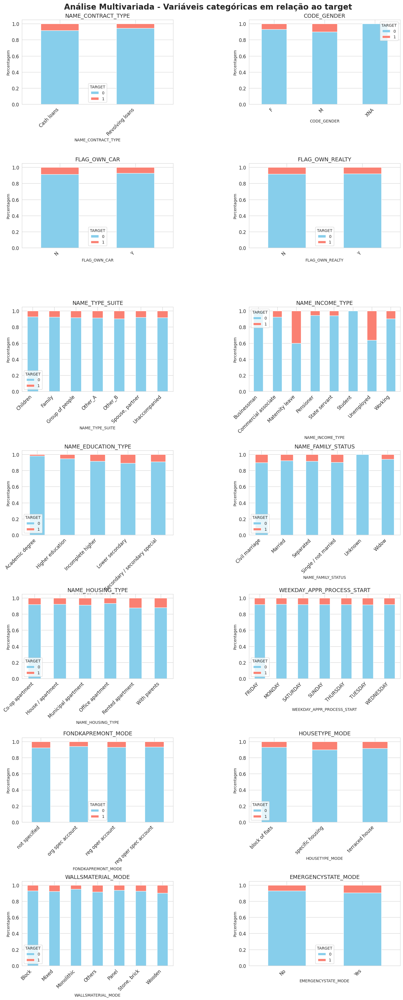

In [59]:
plot_cat_vs_target_percentage(base_dados, 'TARGET', cutoff=8)

### **Principais Insights**

#### **Análise do público (cenário atual da carteira)**

In [73]:
def pod_count_categorias(df, columns):
  if isinstance(columns, str):
    columns = [columns] # se apenas uma variável é passada, então converte para lista

  # calculando a contagem de valores e transforma em df
  count_df = df[columns].value_counts().reset_index()
  count_df.columns = columns + ['Count']

  # calculando a porcentagem de cada valor
  count_df['Percentage'] = (count_df['Count'] / count_df['Count'].sum()) * 100

  # calculando a soma total de contagem
  total_count = count_df['Count'].sum()

  # adicionando a soma total ao dataframe
  total_row = pd.DataFrame({columns[0]:['Total'], 'Count': [total_count], 'Percentage': [100]})
  count_df = pd.concat([count_df, total_row], ignore_index=True)

  return count_df

In [71]:
 base_dados['TARGET'].value_counts()

,count
TARGET,
0,282686
1,24825


In [77]:
base_dados.shape[0]

307511

In [74]:
pod_count_categorias(base_dados, 'TARGET')
# 0 = pagantes
# 1 = inadimplentes

,TARGET,Count,Percentage
0,0,282686,91.927118
1,1,24825,8.072882
2,Total,307511,100.000000


#### Quantidades por tipo de contrato

In [80]:
pod_count_categorias(base_dados, 'NAME_CONTRACT_TYPE')

,NAME_CONTRACT_TYPE,Count,Percentage
0,Cash loans,278232,90.478715
1,Revolving loans,29279,9.521285
2,Total,307511,100.000000


In [81]:
pod_count_categorias(base_dados[base_dados['NAME_CONTRACT_TYPE'] == 'Revolving loans'], ['TARGET'])

,TARGET,Count,Percentage
0,0,27675,94.521671
1,1,1604,5.478329
2,Total,29279,100.000000


In [82]:
pod_count_categorias(base_dados[base_dados['NAME_CONTRACT_TYPE'] == 'Cash loans'], ['TARGET'])

,TARGET,Count,Percentage
0,0,255011,91.654087
1,1,23221,8.345913
2,Total,278232,100.000000


#### Renda

In [84]:
pd.set_option('display.float_format', '{:,.2f}'.format)
base_dados['AMT_INCOME_TOTAL'].describe().round(2)

,AMT_INCOME_TOTAL
count,"307,511.00"
mean,"168,797.92"
std,"237,123.15"
min,"25,650.00"
25%,"112,500.00"
50%,"147,150.00"
75%,"202,500.00"
max,"117,000,000.00"


#### Idade

In [87]:
base_dados['IDADE_ANOS'] = (-1)*base_dados['DAYS_BIRTH']/360
base_dados['IDADE_ANOS'].describe().round(2)

,IDADE_ANOS
count,"307,511.00"
mean,44.55
std,12.12
min,20.80
25%,34.48
50%,43.75
75%,54.67
max,70.08


#### Nível Escolar

In [88]:
pod_count_categorias(base_dados, 'NAME_EDUCATION_TYPE')

,NAME_EDUCATION_TYPE,Count,Percentage
0,Secondary / secondary special,218391,71.02
1,Higher education,74863,24.34
2,Incomplete higher,10277,3.34
3,Lower secondary,3816,1.24
4,Academic degree,164,0.05
5,Total,307511,100.00


In [93]:
pod_count_categorias(base_dados[base_dados['TARGET'] == 1], 'NAME_EDUCATION_TYPE')

,NAME_EDUCATION_TYPE,Count,Percentage
0,Secondary / secondary special,19524,78.65
1,Higher education,4009,16.15
2,Incomplete higher,872,3.51
3,Lower secondary,417,1.68
4,Academic degree,3,0.01
5,Total,24825,100.00


In [94]:
pod_count_categorias(base_dados[base_dados['TARGET'] == 0], 'NAME_EDUCATION_TYPE')

,NAME_EDUCATION_TYPE,Count,Percentage
0,Secondary / secondary special,198867,70.35
1,Higher education,70854,25.06
2,Incomplete higher,9405,3.33
3,Lower secondary,3399,1.20
4,Academic degree,161,0.06
5,Total,282686,100.00


#### Valor do empréstimo

In [95]:
base_dados['AMT_CREDIT'].describe().round(2)

,AMT_CREDIT
count,"307,511.00"
mean,"599,026.00"
std,"402,490.78"
min,"45,000.00"
25%,"270,000.00"
50%,"513,531.00"
75%,"808,650.00"
max,"4,050,000.00"


#### Ocupação

In [98]:
pod_count_categorias(base_dados,['OCCUPATION_TYPE'])

,OCCUPATION_TYPE,Count,Percentage
0,Laborers,55186,26.14
1,Sales staff,32102,15.21
2,Core staff,27570,13.06
3,Managers,21371,10.12
4,Drivers,18603,8.81
5,High skill tech staff,11380,5.39
6,Accountants,9813,4.65
7,Medicine staff,8537,4.04
8,Security staff,6721,3.18
9,Cooking staff,5946,2.82


#### Membros na família

In [99]:
base_dados['CNT_FAM_MEMBERS'].describe().round(2)

,CNT_FAM_MEMBERS
count,"307,509.00"
mean,2.15
std,0.91
min,1.00
25%,2.00
50%,2.00
75%,3.00
max,20.00


In [100]:
pod_count_categorias(base_dados,['CNT_FAM_MEMBERS'])

,CNT_FAM_MEMBERS,Count,Percentage
0,2.00,158357,51.50
1,1.00,67847,22.06
2,3.00,52601,17.11
3,4.00,24697,8.03
4,5.00,3478,1.13
5,6.00,408,0.13
6,7.00,81,0.03
7,8.00,20,0.01
8,9.00,6,0.00
9,10.00,3,0.00


In [101]:
pod_count_categorias(base_dados[base_dados['TARGET']== 1],['CNT_FAM_MEMBERS'])

,CNT_FAM_MEMBERS,Count,Percentage
0,2.00,12009,48.37
1,1.00,5675,22.86
2,3.00,4608,18.56
3,4.00,2136,8.60
4,5.00,327,1.32
5,6.00,55,0.22
6,7.00,6,0.02
7,8.00,6,0.02
8,10.00,1,0.00
9,11.00,1,0.00


In [102]:
pod_count_categorias(base_dados[base_dados['TARGET']== 0],['CNT_FAM_MEMBERS'])

,CNT_FAM_MEMBERS,Count,Percentage
0,2.00,146348,51.77
1,1.00,62172,21.99
2,3.00,47993,16.98
3,4.00,22561,7.98
4,5.00,3151,1.11
5,6.00,353,0.12
6,7.00,75,0.03
7,8.00,14,0.00
8,9.00,6,0.00
9,10.00,2,0.00
